# Probabilistic SLAM in Gen - Tutorial - Part 3 <br/> Grid Proposals

In [2]:
# This is a fix for vscode, because it doesn't like 
# julia docstrings for whatever reason, and throws a `Katex` error.
using Markdown
Base.show(io::IO, ::MIME"text/latex", md::Markdown.MD) = plain(io, md)

In [3]:
include("src/slam_tutorial_part_1.jl");
include("src/slam_tutorial_part_2.jl");

Loading `../data/mit-csail.json` ...

	_zs        Vector{Vector{Float64}}
	_zs_inf    Vector{Vector{Float64}}
	_as        Vector{Float64}
	_zmax      Float64
	_ys        Vector{Vector{Vector{Float64}}}
	_ys_inf    Vector{Vector{Vector{Float64}}}
	_num_a     Int64
	_xs        Vector{Vector{Float64}}
	_hds       Vector{Float64}
	_ps        Vector{Pose}
	_dxs       Vector{Vector{Float64}}
	_dhds      Vector{Float64}
	_us        Vector{Control}
	_T         Int64


In [4]:
#nbx --fname="src/slam_tutorial_part_3.jl"
"""
    I = quantize(x, r; zero=0)::Vector{Int}
Discretize into bins of diameter r, bin-centers lie 
at `z - k*r` for intergers `k`.
"""
quantize(x, r; zero=0) = Int.(floor.((x .+ r./2 .- zero)./r));

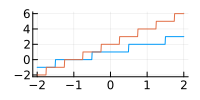

In [5]:
xs  = -2:0.01:2
# ----------------- 
plot(size=(200,100))
plot!(xs, quantize.(xs, 1.0; zero=-1), legend=nothing)
plot!(xs, quantize.(xs, 0.5; zero=-1), legend=nothing)

In [6]:
#nbx
using GenDistributionZoo: ProductDistribution
mvuniform = ProductDistribution(uniform);

## Vector grid

In [7]:
#nbx
function get_offset(v0, k, r)
    center = (r + k.*r)/2
    return v0 - center
end


function first_grid_vec(v0::Vector{Real}, k::Vector{Int}, r::Vector{Real})
    return r + get_offset(v0, k, r) 
end

"""
    vs, ls = vector_grid(v0, k, r)

Returns grid of vectors and their linear indices, given 
a grid center, numnber of grid points along each dimension and
the resolution along each dimension.
"""
function vector_grid(v0::Vector{Float64}, k::Vector{Int}, r::Vector{Float64})
    # Todo: Does it make sense to get a CUDA version of this?
    offset = get_offset(v0, k, r)
    
    shape = Tuple(k)
    cs = CartesianIndices(shape)
    ls = LinearIndices(shape)
    vs = map(I -> [Tuple(I)...].*r + offset, cs);
    return (vs=vs, linear_indices=ls)
end

grid_index(x, v0, k, r) = quantize(x, r, zero=get_offset(v0, k, r));

In [8]:
k  = [11,11,11]
r  = [0.1,0.1, 0.1]
v0 = zeros(3)
grid_args = (v0, k, r)

@btime vs, ls = vector_grid(grid_args...) samples=3 evals=3;

  195.650 μs (4007 allocations: 323.16 KiB)


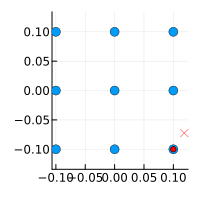

In [9]:
k  = [3,3]
r  = [0.1,0.1]
v0 = zeros(2)
grid_args = (v0, k, r)

vs, ls = vector_grid(grid_args...)

x = mvuniform(vs[1]-r/2, vs[end]+r/2)
I = grid_index(x, grid_args...)

# -----------------------------
mypl = plot(size=(200,200), legend=nothing,
            aspect_ratio=:equal)
scatter!(vs[:], markersize=5)
scatter!([x], marker=:x, c=:red)
scatter!([vs[I...]], c=:red, markersize=3)
scatter!([vs[ls[I...]]], c=:red, markersize=3)


## Eval poses

In [10]:
#nbx
"""
    log_ps, ps = eval_pose_vectors(
                    ps_::CuArray,
                    x::Matrix, 
                    ys_::CuArray, as_::CuArray, w::Int, 
                    s_noise::Float64, outlier::Float64, 
                    outlier_vol::Float64=1.0, zmax::Float64=100.0; sorted=false)

Evaluates a collection of poses 
with respect to different Gaussian mixtures...
"""
function eval_pose_vectors(
            ps_::CuArray,
            x_::CuArray, 
            ys_, as_, w::Int, 
            s_noise::Float64, outlier::Float64, outlier_vol::Float64=1.0, 
            zmax::Float64=100.0; sorted=false)
    
    # Compute sensor measurements and 
    # Gaussian mixture components
    zs_       = cast_cu(ps_, ys_; fov=π, zmax=zmax, cell_rad=0.01)
    ys_tilde_ = get_ys_tilde_cu(zs_, as_, w)
        
    # Evaluate the the observations with respect to the 
    # different Gaussian mixtures computed above
    log_ps_, = sensor_logpdf(x_, ys_tilde_, s_noise, outlier, outlier_vol; return_pointwise=false);
    
    # Move everyting back to CPU
    ps     = Vector.(eachrow(Array(ps_)))
    log_ps = Array(log_ps_)

    # Sort by log prob
    # and return 
    if sorted
        perm   = sortperm(log_ps)
        log_ps = log_ps[perm]
        ps     = ps[perm]
    end
    
    return log_ps, ps
end;



0


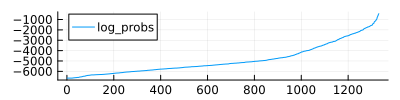

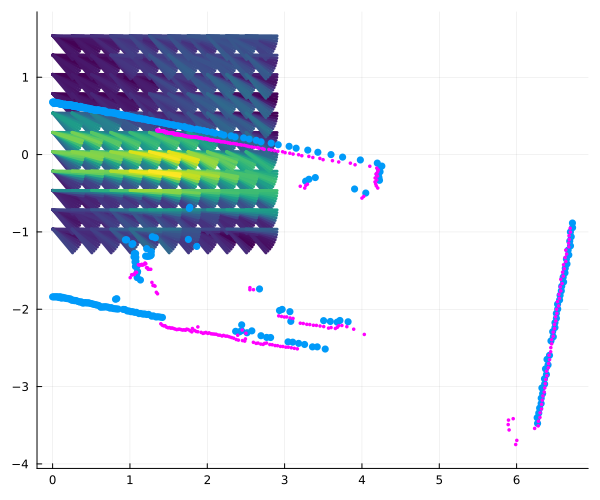

In [11]:
s = 5
t1 = 1070
t2 = t1 + s

ũ = control_prior_model(0.25, 5/180*π)
p0 = _ps[t2]/_ps[t1] + ũ
v0 = Vector(p0)
k = [11,11,11]
r = [0.25,0.25,5/180*π]
grid_args = (v0, k, r)

vs, = vector_grid(grid_args...)
ps  = stack(vs[:])
x   = _ys[t2]
y   = _ys_inf[t1]

ps_ = CuArray(stack(vs[:]))
x_  = CuArray(stack(x))
y_  = CuArray(stack(y))
as_ = CuArray(_as)

w           = 10
s_noise     = 0.1
outlier     = 1e-6
outlier_vol = 1e2
zmax        = 100.0
sensor_args = (w, s_noise, outlier, outlier_vol, zmax)

log_ps, ps = eval_pose_vectors(ps_, x_, y_, as_, sensor_args...; sorted=true);
ps = Pose.(ps)


probs = exp.(log_ps .- logsumexp(log_ps))
println(sum(probs.==1.0))

type = :log_probs
if type == :log_probs
    vals = log_ps
else
    vals = probs
end
# -----------------------------
mypl = plot(vals,size=(400,100), label=String(type))
display(mypl)
# -----------------------------
mypl = plot(size=(600,500), legend=nothing, aspect_ratio=:equal)
cs = cgrad(:viridis)[peak_to_peak(vals)]
plot!(ps, cs; r=.4, linewidth=3)
scatter!(y, markerstrokewidth=0, c=col[1], markersize=4)
scatter!(x .* ps[end], markerstrokewidth=0, c=:magenta, markersize=2)
display(mypl)

## Grid proposal - Pose

In [12]:
#nbx
@gen function pose_grid_proposal(p::Pose, 
                            x::Vector{Vector{Float64}},
                            y::Vector{Vector{Float64}}, 
                            grid_args, 
                            sensor_args)

                            
    v = Vector(p)
    k,r = grid_args
    vs, ls = vector_grid(v, k, r)

    ps_ = CuArray(stack(vs[:]))
    x_  = CuArray(stack(x))
    y_  = CuArray(stack(y))
    as_ = CuArray(_as)

    log_ps, ps = eval_pose_vectors(ps_, x_, y_, as_, sensor_args...; sorted=false);
    probs = exp.(log_ps .- logsumexp(log_ps))

    j ~ categorical(probs)
    x′  = {:x}  ~ mvuniform(vs[j][1:2] - r[1:2]/2, vs[j][1:2] + r[1:2]/2)
    hd′ = {:hd} ~   uniform(vs[j][3]   -   r[3]/2,   vs[j][3]   + r[3]/2)

    return Pose(x′, hd′), (j, vs, ls, log_ps)
end

DynamicDSLFunction{Any}(Dict{Symbol, Any}(), Dict{Symbol, Any}(), Type[Pose, Vector{Vector{Float64}}, Vector{Vector{Float64}}, Any, Any], false, Union{Nothing, Some{Any}}[nothing, nothing, nothing, nothing, nothing], var"##pose_grid_proposal#765", Bool[0, 0, 0, 0, 0], false)

In [13]:
s = 5
t1 = 1070
t2 = t1 + s

ũ = control_prior_model(0.25, 5/180*π)
p1 = _ps[t2]/_ps[t1] + ũ

x   = _ys[t2]
y   = _ys_inf[t1]

k = [11,11,11]
r = [0.25,0.25,5/180*π]
grid_args = (k, r)

sensor_args = (
    w           = 10,
    s_noise     = 0.1,
    outlier     = 1e-6,
    outlier_vol = 1e2,
    zmax        = 100.0
)

p2, (j1, vs1, ls1, log_ps1) = pose_grid_proposal(p1, x, y, grid_args, sensor_args)
 _, (j2, vs2, ls2, log_ps2) = pose_grid_proposal(p2, x, y, grid_args, sensor_args)

probs1 = exp.(log_ps1 .- logsumexp(log_ps1))
probs2 = exp.(log_ps2 .- logsumexp(log_ps2))

i1 = grid_index(Vector(p2), Vector(p1), grid_args...)
i2 = grid_index(Vector(p1), Vector(p2), grid_args...)

println("$(log_ps1[ls1[i1...]]), $(log_ps2[ls2[i2...]])")
println("$(probs1[ls1[i1...]]), $(probs2[ls2[i2...]])")

-318.3015831167839, -4483.456933714682
1.0, 0.0


### Iterating grid proposals (by hand)

In [16]:
t0   = 1050
step = 4
T    = 100

p = Pose()
m = filter(by_not_infs, _ys_inf[t0])
m = m .* p

ps = Pose[]
grids = []
for i=1:T


    t1 = t0 + (i-1) * step
    t2 = t0 +     i * step
    ũ = sum(_us[t1:t2-1])
    u = Control(rot(-_hds[t1]+p.hd)*ũ.dx, ũ.dhd)
    p = p + u
    


    x = _ys_inf[t0 + i*step]

    y = m[1:10:end]

    iter = 5
    @time  begin for j=1:iter
        # grid_args = (
        #     k = [3,3,5],
        #     r = [0.2,0.2,10/180*π] ./j
        # )
        # sensor_args = (
        #     w           = 10,
        #     s_noise     = 0.05,
        #     outlier     = 1e-6,
        #     outlier_vol = 1e2,
        #     zmax        = 100.0,
        # )
        grid_args = (
            k = [11,11,11],
            r = [0.1,0.1, 2/180*π] ./j
        )
        
        sensor_args = (
            w           = 10,
            s_noise     = 0.1,
            outlier     = 1e-6,
            outlier_vol = 1e2,
            zmax        = 100.0
        )

        p, (j, vs, ls, log_ps) = pose_grid_proposal(p, x, y, grid_args, sensor_args)

    end end
    
    x = filter(by_not_infs, x)
    m = vcat(m, x .* p)


    push!(ps, p)
end


# -----------------------------
mypl = plot(size=(800,600), legend=nothing,
            aspect_ratio=:equal)
plot!(ps; c=:red, r=.25, linewidth=3)
scatter!(m, markerstrokewidth=0, c=col[1], markersize=1, alpha=0.3)
mypl



  0.026856 seconds (32.46 k allocations: 3.398 MiB)
  0.090034 seconds (33.53 k allocations: 3.440 MiB, 64.28% gc time)
  0.027207 seconds (32.46 k allocations: 3.407 MiB)
  0.027329 seconds (32.46 k allocations: 3.411 MiB)
  0.051037 seconds (33.49 k allocations: 3.454 MiB, 39.69% gc time)
  0.027355 seconds (32.46 k allocations: 3.419 MiB)
  0.027468 seconds (32.45 k allocations: 3.424 MiB)
  0.049991 seconds (33.53 k allocations: 3.468 MiB, 38.06% gc time)
  0.027579 seconds (32.46 k allocations: 3.432 MiB)
  0.028032 seconds (32.72 k allocations: 4.060 MiB)
  0.027543 seconds (32.47 k allocations: 3.440 MiB)
  0.043045 seconds (33.51 k allocations: 3.483 MiB, 26.13% gc time)
  0.027614 seconds (32.46 k allocations: 3.448 MiB)
  0.027767 seconds (32.44 k allocations: 3.452 MiB)
  0.042855 seconds (33.74 k allocations: 3.712 MiB, 26.16% gc time)
  0.028363 seconds (32.71 k allocations: 3.881 MiB)
  0.027763 seconds (32.47 k allocations: 3.465 MiB)
  0.042504 seconds (33.78 k allocati

### What is the induced distribution

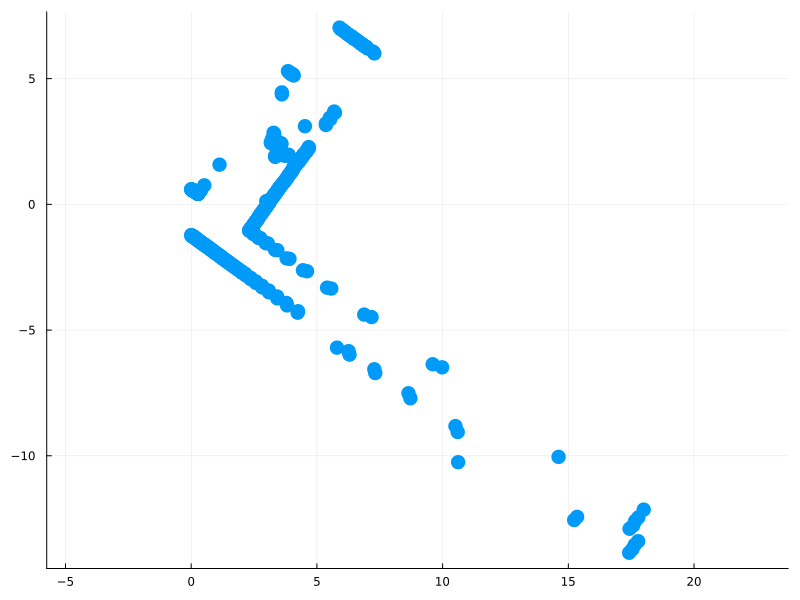

In [39]:
step = 4
t1 = 1060
t2 = t1 + step

# # -----------------------------
mypl = plot(size=(800,600), legend=nothing, aspect_ratio=:equal)
scatter!(_ys_inf[t1], markerstrokewidth=0, c=col[1], markersize=8, alpha=1)
mypl


In [63]:
step = 4
t1 = 1060
t2 = t1 + step

S = 5_000


ps = Pose[]
qs = Pose[]
ss = Pose[]

ũ = sum(_us[t1:t2-1])
u = Control(rot(-_hds[t1])*ũ.dx, ũ.dhd)
p0 = Pose() + u

for i=1:S


    dx = 1.5
    dθ = 22.5/180*π
    
    p = p0 + Control(mvuniform([-dx,-dx,-dθ],[dx,dx,dθ]))
    push!(ps, p)


    dx = .5
    dθ = 10.5/180*π
    p = p0 # + Control(mvuniform([-dx,-dx,-dθ],[dx,dx,dθ]))

    push!(ss, p)
    
    x = _ys_inf[t2]
    y = _ys_inf[t1]

    iter = 7
    q = p
    for j=1:iter
        grid_args = (
            k = [7,7,7],
            r = [0.1,0.1, 5/180*π] ./j
        )
        
        sensor_args = (
            w           = 10,
            s_noise     = 0.1,
            outlier     = 1e-6,
            outlier_vol = 1e2,
            zmax        = 100.0
        )

        q, (j, vs, ls, log_ps) = pose_grid_proposal(q, x, y, grid_args, sensor_args)

    end
    

    push!(qs, q)
end

In [64]:
x = _ys_inf[t2]
y = _ys_inf[t1]

ps_ = CuArray(stack(Vector.(ps)))
x_  = CuArray(stack(x))
y_  = CuArray(stack(y))
as_ = CuArray(_as)

sensor_args = (
            w           = 10,
            s_noise     = 0.1,
            outlier     = 1e-6,
            outlier_vol = 1e2,
            zmax        = 100.0
        )

log_ps, _ = eval_pose_vectors(ps_, x_, y_, as_, sensor_args...; sorted=false);
perm = sortperm(log_ps)
log_ps = log_ps[perm]
ps = ps[perm];

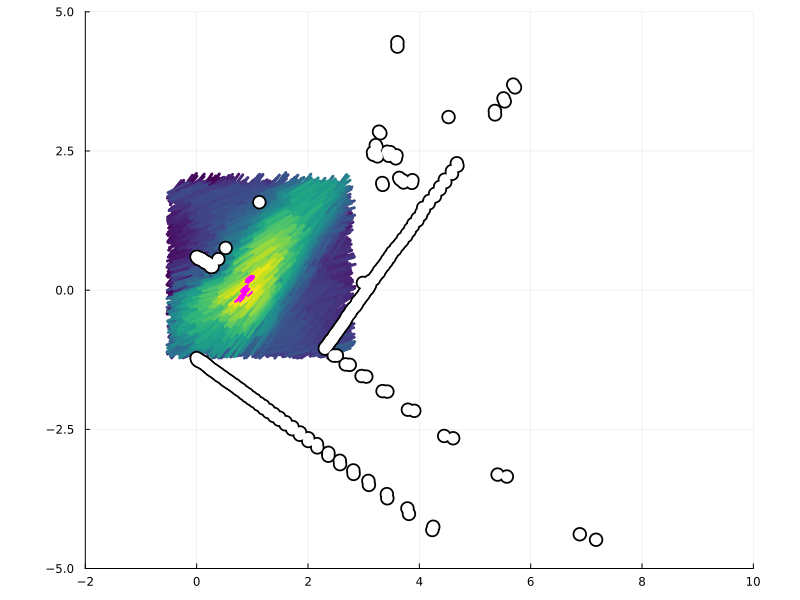

In [65]:
# # -----------------------------
mypl = plot(size=(800,600), legend=nothing, aspect_ratio=:equal, xlim=(-2,10), ylim=(-5,5))
cs = cgrad(:viridis)[peak_to_peak(log_ps)]
plot!(ps, cs; r=.4, linewidth=3)
# plot!(ps; c=:red, r=.1, linewidth=3)
plot!(ss; c=:white, r=.1, linewidth=2, alpha=1.)
scatter!(_ys_inf[t1], markerstrokewidth=0, c=:black, markersize=8, alpha=1)
scatter!(_ys_inf[t1], markerstrokewidth=0, c=:white, markersize=6, alpha=1)
display(mypl)
savefig("_imgs/iterated_proposal_dist_1_.png")
# # # -----------------------------
mypl = plot(size=(800,600), legend=nothing, aspect_ratio=:equal, xlim=(-2,10), ylim=(-5,5))
cs = cgrad(:viridis)[peak_to_peak(log_ps)]
plot!(ps, cs; r=.4, linewidth=3)
plot!(qs[1:1_00]; c=:magenta, r=.1, linewidth=2, alpha=1.)
scatter!(_ys_inf[t1], markerstrokewidth=0, c=:black, markersize=8, alpha=1)
scatter!(_ys_inf[t1], markerstrokewidth=0, c=:white, markersize=6, alpha=1)
savefig("_imgs/iterated_proposal_dist_2_.png")
mypl

## Grid proposal - Trace

In [57]:
get_last_pose(tr) = tr[][end][1]
get_last_map(tr)  = tr[][end][3]

get_last_map (generic function with 1 method)

In [173]:
@gen function tr_grid_proposal(tr,
                               i,
                               ch,
                               grid_args, 
                               sensor_args)
    

    _, state, t0, step, us, = get_args(tr)

    p,_,m = state
    t1 = t0 + (i-1) * step
    t2 = t0 +     i * step
    ũ = sum(us[t1:t2-1])
    u = Control(rot(-_hds[t1]+p.hd)*ũ.dx, ũ.dhd)
    p = p + u
    
    v = Vector(p)
    k,r = grid_args
    vs, ls = vector_grid(v, k, r)

    x = ch[i => :sensor => :x]
    y = m

    ps_ = CuArray(stack(vs[:]))
    x_  = CuArray(stack(x))
    y_  = CuArray(stack(y))
    as_ = CuArray(_as)

    log_ps, ps = eval_pose_vectors(ps_, x_, y_, as_, sensor_args...; sorted=false);


    probs = exp.(log_ps .- logsumexp(log_ps))
    j ~ categorical(probs)

    # vj_min = vs[j]-r/2
    # vj_max = vs[j]+r/2
    vj_min = v-r/2
    vj_max = v+r/2
    x′  = {i => :pose => :x}  ~ mvuniform(vj_min[1:2], vj_max[1:2])
    hd′ = {i => :pose => :hd} ~ uniform(vj_min[3], vj_max[3])

    v′  = [x′; hd′]
    p′  = Pose(v′)

    return Pose(v′)
end


@transform transform (tr_prop) to (tr_slam) begin

    _ , i, = get_args(tr_prop)
    
    x  = @read(tr_prop[i => :pose => :x],   :continuous)    
    hd = @read(tr_prop[i => :pose => :hd],  :continuous)    
    @write(tr_slam[i => :pose => :x],  x, :continuous)
    @write(tr_slam[i => :pose => :hd],  hd, :continuous)
end


TraceTransformDSLProgram(var"#350###transform_fn!#1049", nothing)

In [174]:
x_noise  = 0.1
hd_noise = 5/360*2π

w           = 10
s_noise     = 0.2
outlier     = 1e-3
outlier_vol = 1.0
zmax = Inf

t0   = 1050
step = 4
T    = 10

ys = _ys_inf
us = _us


ch = choicemap()
for i=1:T
    ch[i => :sensor => :x] = _ys_inf[t0 + i*step]
end

args = (T, (Pose(), nothing, ys[t0]), t0, step, us, x_noise, hd_noise, w, s_noise, outlier, outlier_vol, zmax)
tr,w = generate(slam_chain, args, ch);

In [175]:
k = [11,11,11]
r = [0.1,0.1,3/180*π]
grid_args = (k, r)

sensor_args = (
    w           = 10,
    s_noise     = 0.1,
    outlier     = 1e-6,
    outlier_vol = 1e2,
    zmax        = 100.0
)

ch = choicemap()
i=T+1
ch[i => :sensor => :x] = _ys_inf[t0 + i*step]
tr_prop = simulate(tr_grid_proposal, (tr, i, ch, grid_args, sensor_args))

get_retval(tr_prop)
get_choices(tr_prop)

│
├── :j : 1314
│
└── 11
    │
    └── :pose
        │
        ├── :hd : -0.5239462168446625
        │
        └── :x : [0.7622705931494305, -0.17333883801003322]


In [176]:
using GenParticleFilters

[0.1, 0.1, 0.05235987755982988], 100
2 (958.56 ms)
3 (800.14 ms)
1 (838.36 ms)
2 (838.97 ms)
2 (837.37 ms)
2 (897.87 ms)
1 (862.72 ms)
3 (883.12 ms)
3 (879.11 ms)


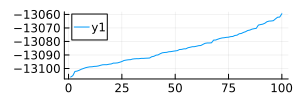

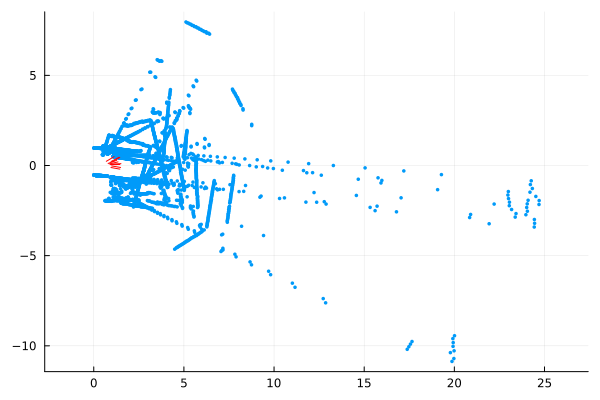

In [177]:

N = 100

x_noise  = 0.2
hd_noise = 5/360*2π

w           = 10
s_noise     = 0.2
outlier     = 1e-3
outlier_vol = 1.0
zmax = Inf

t0   = 1050
step = 4
T    = 10

ys = _ys_inf
us = _us

# Initialize the PF
ch = choicemap()
ch[1 => :sensor => :x] = _ys_inf[t0 + step]

args = (T, (Pose(), nothing, ys[t0]), t0, step, us, x_noise, hd_noise, w, s_noise, outlier, outlier_vol, zmax)
# state = initialize_particle_filter(slam_chain, (1, args[2:end]...), ch, N);
state = pf_initialize(slam_chain, (1, args[2:end]...), ch, N);


# (Approximately) "ensure"  that the 
# initial particles are samples from the posterior
# r = maybe_resample!(state)

# Look at the initial state
println("$(r), $(length(Set(state.parents)))")

diffs = argdiffs([1; zeros(length(args)-1)])
times = []
for i=2:T

    # Set incoming observations
    ch = choicemap()
    ch[i => :sensor => :x] = _ys_inf[t0 + i*step]

    # Resample and rejuvenate if the effective sample size is too low
    if effective_sample_size(state) < N/2
        # Perform residual resampling, pruning low-weight particles
        pf_resample!(state, :residual)
    end

    # Update filter state with new observation at timestep t
    # sec = @elapsed pf_update!(state, (i, args[2:end]...),  diffs, ch)
    sec = @elapsed pf_update!(state, (i, args[2:end]...), diffs, ch,
               tr_grid_proposal, (i, ch, grid_args, sensor_args), transform)

    # # Step forward and maybe resample
    # # sec = @elapsed dw, = particle_filter_step!(state, (i, args[2:end]...), diffs, ch)
    # r = maybe_resample!(state; ess_threshold=N/4)

    # Collect runtimes and plot stuff
    ms = sec*1_000
    push!(times, ms)
    println("$(length(Set(state.parents))) ($(nice_f(ms)) ms)")
end

trs    = state.traces
scores = get_score.(trs)
perm   = sortperm(scores)
trs    = trs[perm]
scores = scores[perm]

tr = trs[1]

ps = [re[1] for re in tr[]]
ms = [re[3] for re in tr[]]

# ------------------
display(plot(scores, size=(300,100)))
# ---
mypl = plot(legend=nothing, aspect_ratio=:equal)
scatter!(ms[end], markersize=2, markerstrokewidth=0, c=col[1])
plot!(ps, markersize=6, c=:red)
mypl

In [127]:
n = 3

p   = get_pose(tr)
obs = tr[:sensor => :x]
m,  = get_args(tr)

q = p
qs = []
grids = []
for i=1:n
    grid_args = (
        k = [5,5,5],
        r = [0.2,0.2,5/180*π]./i,
    )
    sensor_args = (
        w           = 20,
        s_noise     = 0.05,
        outlier     = 1e-6,
        outlier_vol = 1e3,
        zmax        = 100.0,
    )

    @time q, ( j,  vs,  ls,  log_ps,  ch_back)  = grid_proposal(q, obs, m, grid_args, sensor_args)
    # @time ch_back, q, j, vs, log_ps = grid_proposal(tr′, grid_args, sensor_args)
    # println(size(vs), size(log_ps))
    push!(qs, q)
    push!(grids, (vs, log_ps))
    # ch = choicemap()
    # ch[:pose => :x]  = q.x 
    # ch[:pose => :hd] = q.hd 
    # tr′, = Gen.update(tr′, ch)
end


# -----------------------------
mypl = plot(size=(600,500), legend=nothing,
            aspect_ratio=:equal)

# cs = cgrad(:viridis)[peak_to_peak(log_ps)]
# plot!(ps, cs; r=.25, linewidth=3)
scatter!(y, markerstrokewidth=0, c=col[1], markersize=8)
scatter!(x .* p, markerstrokewidth=0, c=:lightgray, markersize=2)
scatter!(x .* qs[end], markerstrokewidth=0, c=:black, markersize=2)
# for i=1:n
#     q = qs[i]
#     # vs, log_ps = grids[i]
#     scatter!(x .* q, markerstrokewidth=0, c=:magenta, markersize=2, alpha=i/n)
#     # plot!(Pose.(vs[:]), r=0.2, c=:lightgray)
# end
# # for i=1:n
# #     q = qs[i]
# #     plot!(q, r=0.2, linewidth=3, c=:red)
# # end
mypl

LoadError: ArgumentError: invalid index: :pose of type Symbol

p[j] = 0.999999999981776
-449.29038190043605


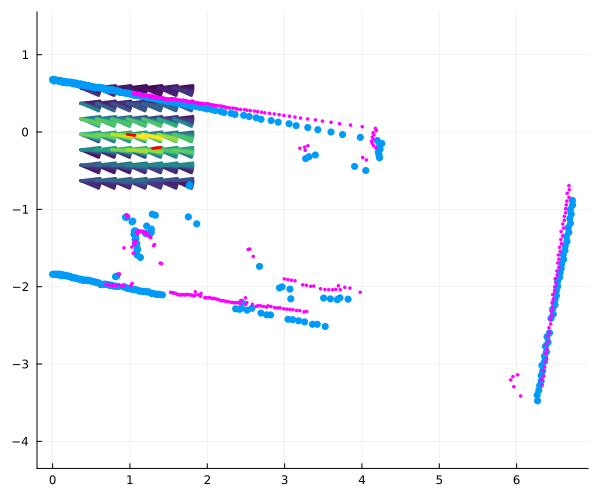

In [129]:
ch = choicemap()
ch[:pose => :x]  = q.x
ch[:pose => :hd] = q.hd
tr2, = Gen.update(tr, ch)
ch_back, q2, j, vs, log_ps = grid_proposal(tr2, grid_args, sensor_args)
println(log_ps[j])

p = tr[][:p]
y, = get_args(tr)
x = tr[:sensor => :x]

perm = sortperm(log_ps)
ps     = Pose.(vs[:])[perm]
log_ps = log_ps[perm]
# -----------------------------
mypl = plot(size=(600,500), legend=nothing,
            aspect_ratio=:equal)

cs = cgrad(:viridis)[peak_to_peak(log_ps)]
plot!(ps, cs; r=.25, linewidth=3)
scatter!(y, markerstrokewidth=0, c=col[1], markersize=4)
scatter!(x .* q, markerstrokewidth=0, c=:magenta, markersize=2)
plot!(p, c=:red, r=0.1, linewidth=3)
plot!(q, c=:red, r=0.1, linewidth=3)
# plot!(q2, c=:red, r=0.1, linewidth=3)
mypl


p[j] = 1.0
  0.001697 seconds (1.31 k allocations: 108.828 KiB)
(3, 3, 5)(45,)
p[j] = 1.0
  0.001130 seconds (1.31 k allocations: 109.062 KiB)
(3, 3, 5)(45,)
p[j] = 1.0
  0.001137 seconds (1.31 k allocations: 109.062 KiB)
(3, 3, 5)(45,)
p[j] = 1.0
  0.001146 seconds (1.31 k allocations: 108.766 KiB)
(3, 3, 5)(45,)
p[j] = 0.9947915792414246
  0.001122 seconds (1.31 k allocations: 109.766 KiB)
(3, 3, 5)(45,)


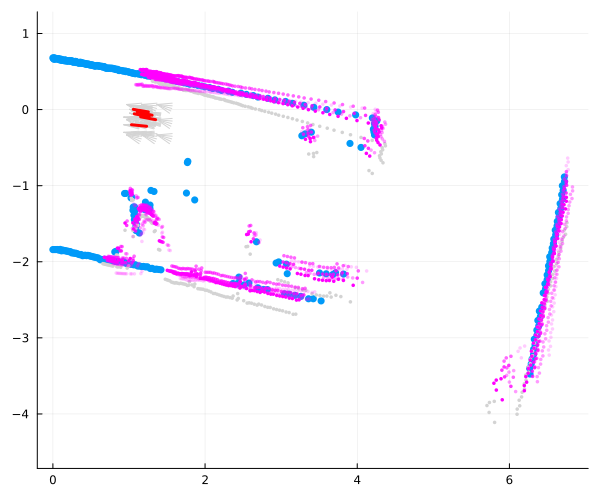

In [85]:

n = 5
tr′ = tr

qs = []
grids = []
for i=1:n
    grid_args = (
        k = [3,3,5],
        r = [0.2,0.2,10/180*π]./i,
    )
    sensor_args = (
        w           = 10,
        s_noise     = 0.05,
        outlier     = 1e-6,
        outlier_vol = 1e2,
        zmax        = 100.0,
    )

    @time ch_back, q, j, vs, log_ps = grid_proposal(tr′, grid_args, sensor_args)
    println(size(vs), size(log_ps))
    push!(qs, q)
    push!(grids, (vs, log_ps))
    ch = choicemap()
    ch[:pose => :x]  = q.x 
    ch[:pose => :hd] = q.hd 
    tr′, = Gen.update(tr′, ch)
end

p = tr[][:p]
y, = get_args(tr)
x = tr[:sensor => :x]


# -----------------------------
mypl = plot(size=(600,500), legend=nothing,
            aspect_ratio=:equal)

# cs = cgrad(:viridis)[peak_to_peak(log_ps)]
# plot!(ps, cs; r=.25, linewidth=3)
scatter!(y, markerstrokewidth=0, c=col[1], markersize=4)
scatter!(x .* p, markerstrokewidth=0, c=:lightgray, markersize=2)
for i=1:n
    q = qs[i]
    vs, log_ps = grids[i]
    scatter!(x .* q, markerstrokewidth=0, c=:magenta, markersize=2, alpha=i/n)
    plot!(Pose.(vs[:]), r=0.2, c=:lightgray)
end
for i=1:n
    q = qs[i]
    plot!(q, r=0.2, linewidth=3, c=:red)
end
mypl


In [86]:
function metropolis_hastings2(
    trace, proposal::GenerativeFunction, proposal_args::Tuple, proposal_addrs::Vector;
    check=false, observations=EmptyChoiceMap())

    model_args = get_args(trace)
    argdiffs = map((_) -> NoChange(), model_args)
    
    proposal_args_forward = (trace, proposal_args...,)
    (fwd_choices, fwd_weight, re) = propose(proposal, proposal_args_forward)
    ch_back, = re
    ch = choicemap()
    for a in proposal_addrs
        ch[a] = fwd_choices[a]
        println(ch[a])
    end

    (new_trace, weight, _, discard) = Gen.update(trace,
        model_args, argdiffs, ch)

    proposal_args_backward = (new_trace, proposal_args...,)
    (bwd_weight, _) = Gen.assess(proposal, proposal_args_backward, ch_back)
    println("$(weight),  $(fwd_weight), $(bwd_weight)")


    alpha = weight - fwd_weight + bwd_weight
    check && check_observations(get_choices(new_trace), observations)
    if log(rand()) < alpha
        # accept
        return (new_trace, true)
    else
        # reject
        return (trace, false)
    end
end

metropolis_hastings2 (generic function with 2 methods)

p[j] = 1.0
[0.8965550195804525, -0.16322164761456007]
-0.13517929582496183
p[j] = 0.0
254.37120880180967,  4.964517696914965, -Inf
false


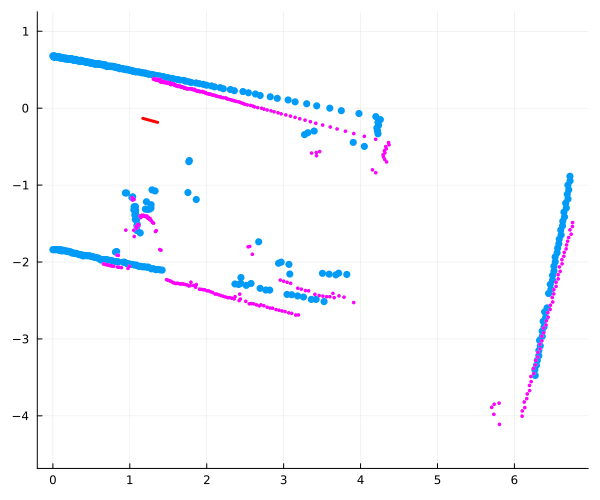

In [91]:

n = 1
tr′ = tr

qs    = []
grids = []
for i=1:n
    grid_args = (
        k = [7,7,7],
        r = [0.2,0.2,10/180*π]./i,
    )
    sensor_args = (
        w           = 10,
        s_noise     = 0.05,
        outlier     = 1e-6,
        outlier_vol = 1e2,
        zmax        = 100.0,
    )

    tr′, accepted = metropolis_hastings2(tr′, 
                                         grid_proposal, (grid_args, sensor_args), 
                                         [:pose => :x, :pose => :hd] )

    q = tr′[][:p]
    push!(qs, q)
    println(accepted)

end

p = tr[][:p]
y, = get_args(tr)
x = tr[:sensor => :x]


# -----------------------------
mypl = plot(size=(600,500), legend=nothing,
            aspect_ratio=:equal)

# cs = cgrad(:viridis)[peak_to_peak(log_ps)]
# plot!(ps, cs; r=.25, linewidth=3)
scatter!(y, markerstrokewidth=0, c=col[1], markersize=4)
scatter!(x .* p, markerstrokewidth=0, c=:lightgray, markersize=2)
for i=1:n
    q = qs[i]
#     # vs, log_ps = grids[i]
    scatter!(x .* q, markerstrokewidth=0, c=:magenta, markersize=2, alpha=i/n)
#     # plot!(Pose.(vs[:]), r=0.2, c=:lightgray)
end
for i=1:n
    q = qs[i]
    plot!(q, r=0.2, linewidth=3, c=:red)
end
mypl
